# New York City Airbnb Data Analysis
**Task 1: Data cleaning and visualization**

    Exploratory data analysis was performed on the entire dataset, and several conclusions were summarized. Additionally, geographic information on New York City was collected from Kaggle, and after cleaning and organizing the data, an interactive map object was created using the Folium package. The visualizations were used to present the insights gained from the Airbnb platform dataset.

**Task 2 : In which area are the most competitive listings located?**

Apply Unsupervised Learning Algorithm: K-means clustering

    By clustering the listings based on relevant fields of the Reviews, insights can be gained on the grouping of listings. This can help identify which listings are more competitive and which ones may need more marketing to improve booking rates.
    
<!-- 

> Dataset: https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data

    Author: Leo Luo, 2023.2.2 -->

In [2]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
import seaborn as sns

## Load File

In [3]:
file_path = r'Airbnb_NewYorkCity_2019.csv'
df_airbnb = pd.read_csv(file_path)
df_airbnb.shape

(48895, 16)

In [6]:
df_airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [7]:
print('Number of hosts: ', df_airbnb['host_id'].nunique())

Number of hosts:  37457


## Data Preprocessing

In [8]:
df_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

**Missing Value**

    reviews_per_month
    last_review

The missing values for Name and Host_Name have little impact on our analysis and the number of missing values is small, so they can be ignored. For last_review, the missing values likely indicate that the listing has never been reviewed, so it is reasonable for reviews_per_month to be empty, and the number of missing values seems to match. Therefore, we can fill in the missing values for reviews_per_month with 0.

In [9]:
df_airbnb.isna().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [10]:
df_airbnb['reviews_per_month'].fillna(0, inplace=True)

We will perform some transformations on the 'last_review' column, as we are not sure about the exact timestamp of the data. Therefore, we will use the most recent timestamp when 'last_review' occurred as a reference point and create a new column that indicates the number of days between the "now" and the last review.

In [11]:
df_airbnb['last_review'] = pd.to_datetime(df_airbnb['last_review'])
current_day = df_airbnb['last_review'].max()

In [12]:
# LR_days means The number of days since the last comment was "now"
df_airbnb['LR_days'] = current_day - df_airbnb['last_review']
df_airbnb['LR_days'] = df_airbnb['LR_days'].dt.days

# Fill na with 99999
df_airbnb['LR_days'] = df_airbnb['LR_days'].fillna(99999)

## Task 1: EDA
    1. The majority of listings are located in Manhattan and Brooklyn areas.
    2. The most common room types are entire home/apartment and private room.
    3. The distribution and conclusion of the number of listings for short-term and long-term rentals.
    4. On average, the rent for entire home/apartment is higher than private room.
    5. On average, the highest rent is in Manhattan (median=130), followed by Brooklyn (median=90), while the lowest rent is in Bronx.
    6. The host with the most listings.


[Text(0, 0, '25409'), Text(0, 0, '22326'), Text(0, 0, '1160')]

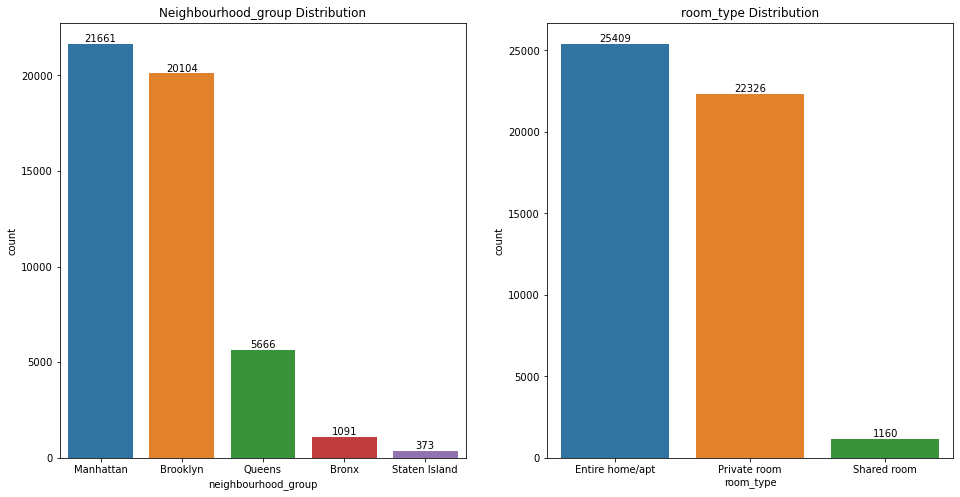

In [8]:
fig = plt.figure(figsize=(16,8))

ax1 = fig.add_subplot(1, 2, 1)
bar1 = sns.countplot(data=df_airbnb, 
                x='neighbourhood_group',
                order=df_airbnb['neighbourhood_group'].value_counts().index)
ax1.set_title('Neighbourhood_group Distribution')
plt.bar_label(bar1.containers[0])  # annotation real number

ax2 = fig.add_subplot(1, 2, 2)
bar2 = sns.countplot(data=df_airbnb,
                x='room_type',
                order=df_airbnb['room_type'].value_counts().index)
ax2.set_title('room_type Distribution')
plt.bar_label(bar2.containers[0])  # annotation real number

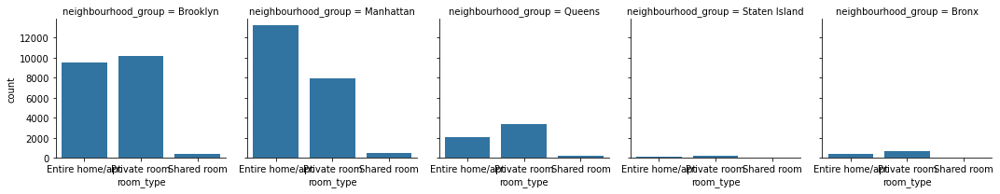

In [9]:
g = sns.FacetGrid(data=df_airbnb, col='neighbourhood_group')
g.map(sns.countplot, 'room_type', order=df_airbnb['room_type'].value_counts().index)
plt.show()

**Minimum_nights**

(0.0, 50.0)

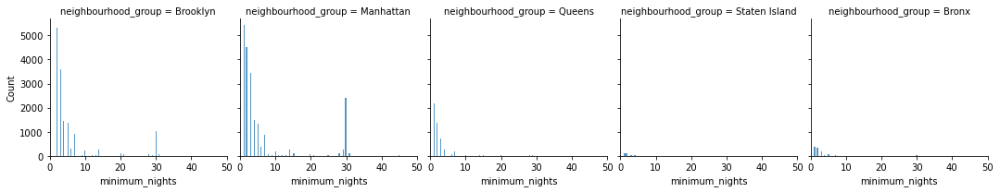

In [10]:
g = sns.FacetGrid(data=df_airbnb, col='neighbourhood_group')
g.map(sns.histplot, 'minimum_nights')
plt.xlim(0, 50)

Here's an interesting discovery: some of the listings in the Manhattan and Brooklyn areas only provide accommodations for more than 30 days. According to U.S. housing policy, rentals that last more than a month are considered long-term rentals. After detailed analysis, I believe there may be two reasons behind this phenomenon:

1. The U.S. housing policy has more restrictions and taxes on short-term rentals, which leads many hosts to provide long-term rental services instead.
2. According to information on the Airbnb platform website, a new service model called "Airbnb Luxe" is being proposed for Airbnb Plus members, which also encourages providing long-term travel rentals for travelers.

**Which area has the highest rental pricing?**

In [11]:
df_airbnb['price'].describe()

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

Text(0.5, 1.0, 'Distribution of prices for each room type')

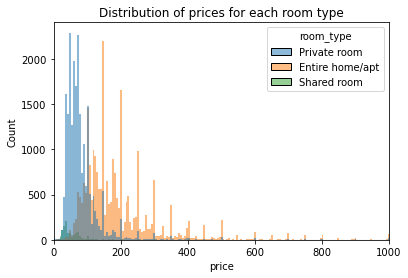

In [12]:
sns.histplot(data=df_airbnb, x='price', hue='room_type')
plt.xlim(0, 1000)
plt.title('Distribution of prices for each room type')

Perform "price" t-test between private_room and entire_home.

In [13]:
import scipy

# Populations
private_room = df_airbnb[df_airbnb['room_type']=='Private room']['price']
entire_home = df_airbnb[df_airbnb['room_type']=='Entire home/apt']['price']

# Perform Levene test for equal variances.
print('Levene test Result: ')
print(scipy.stats.levene(private_room, entire_home, center='mean', proportiontocut=0.05))

# Welch’s t-test
print('\nWelch’s t-test Result:')
print(scipy.stats.ttest_ind(private_room, entire_home, equal_var=False))

Levene test Result: 
LeveneResult(statistic=1003.8349734329769, pvalue=4.848921230754112e-218)

Welch’s t-test Result:
Ttest_indResult(statistic=-58.670889864481104, pvalue=0.0)


First, by looking at the histograms, we found that the rental price of private rooms is below $200/night, while the rental price of entire homes/apartments is generally higher than private rooms, with more extreme values. The rental price of shared rooms is the lowest, as we expected.

To be rigorous, we performed an independent t-test on the two populations of private rooms and entire homes/apartments. First, we used the Levene test to compare the variances, and the p-value was close to 0, indicating that we should adopt the "heterogeneous variance hypothesis." Then we performed Welch's t-test, and the p-value was also close to 0, indicating that the rental price of entire homes/apartments is significantly higher than that of private rooms, assuming that the two populations are normally distributed.

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

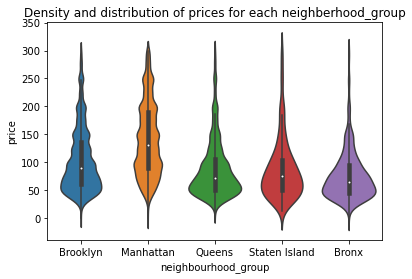

In [14]:
# Filter price < 300
price_less_than_300 = df_airbnb[df_airbnb['price'] < 300]

# plot, groupby neighbourhood
vio_price = sns.violinplot(data=price_less_than_300, x='neighbourhood_group', y='price')
vio_price.set_title('Density and distribution of prices for each neighberhood_group')

Next, by using statistical percentiles, we can observe that at least 75% of the Airbnb listings have rental prices below $200/night, and the maximum value is $10,000. Therefore, we further filtered out listings with prices less than $300 for visualization and analysis. We found that on average, Manhattan has the highest rental prices (median=130), followed by Brooklyn (median=90), while the Bronx has the lowest rental prices.


**The host who has the most listings on Airbnb platform**

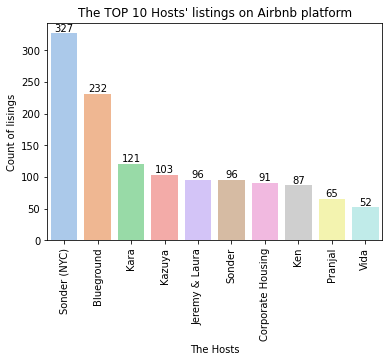

In [15]:
# Find the TOP 10 Hosts, get their host_id, name, listings
top_10_host_id = df_airbnb['host_id'].value_counts().head(10).index
top_10_host_listings = df_airbnb['host_id'].value_counts().head(10).values
top_10_host_name = []

for id in top_10_host_id:
    top_10_host_name.append(df_airbnb[df_airbnb['host_id']==id].iloc[0]['host_name'])

# Plot
top10_bar = sns.barplot(x=top_10_host_name, y=top_10_host_listings, palette=sns.color_palette("pastel"))
plt.bar_label(top10_bar.containers[0])
plt.xticks(rotation=90)
plt.title("The TOP 10 Hosts' listings on Airbnb platform")
plt.ylabel("Count of lisings")
plt.xlabel("The Hosts")
plt.show()

We found that the top two hosts have a significant lead over other hosts in terms of the number of listings. Sonder (NYC) has 327 listings, while Blueground has 232 listings.

### Use Folium to build visual maps and do geographic analysis
    It is not easy to find detailed map coordinate resources for New York City. After some searching, I found a usable geojson file on Kaggle.
> https://www.kaggle.com/datasets/saidakbarp/nyc-zipcode-geodata

    During the analysis, I encountered many difficulties that required additional processing of the geographic data. I spent a lot of time and independently organized my notes on the processing process. Those who want to understand the detailed processing process can refer to the content of "geo_processing.ipynb".

**Analysis focus:**

    Distribution of rental prices for Airbnb listings.

First，We import geopandas.

In [4]:
import geopandas as gpd

geodf = gpd.read_file('NYC_MAP_v2.geojson')
print(geodf.shape)
geodf.head()

(202, 12)


,OBJECTID,postalCode,STATE,borough,ST_FIPS,CTY_FIPS,BLDGpostalCode,Shape_Leng,Shape_Area,@id,PO_NAME,geometry
0,1,11372,NY,Queens,36,081,0,20624.692317,2.016328e+07,http://nyc.pediacities.com/Resource/PostalCode...,Jackson Heights,"POLYGON ((-73.86942 40.74916, -73.89507 40.746..."
1,2,11004,NY,Queens,36,081,0,23002.816039,2.260653e+07,http://nyc.pediacities.com/Resource/PostalCode...,Glen Oaks,"POLYGON ((-73.71068 40.75004, -73.70869 40.748..."
2,3,11040,NY,Queens,36,081,0,15749.161511,6.269333e+06,http://nyc.pediacities.com/Resource/PostalCode...,New Hyde Park,"POLYGON ((-73.70098 40.73890, -73.70309 40.744..."
3,4,11426,NY,Queens,36,081,0,35932.810639,4.941836e+07,http://nyc.pediacities.com/Resource/PostalCode...,Bellerose,"POLYGON ((-73.72270 40.75373, -73.72251 40.753..."
4,5,11365,NY,Queens,36,081,0,38693.565676,6.938587e+07,http://nyc.pediacities.com/Resource/PostalCode...,Flushing,"POLYGON ((-73.81089 40.72717, -73.81116 40.728..."


**To calculate the median rent for each neighborhood.**

In [84]:
medprice_neighbourhood = df_airbnb.groupby('neighbourhood').aggregate({'price': np.median})
medprice_neighbourhood.columns = ['median_price']
medprice_neighbourhood.reset_index()

,neighbourhood,median_price
0,Allerton,66.5
1,Arden Heights,72.5
2,Arrochar,65.0
3,Arverne,125.0
4,Astoria,85.0
...,...,...
216,Windsor Terrace,123.0
217,Woodhaven,52.0
218,Woodlawn,68.0
219,Woodrow,700.0


In [85]:
# merge median price of each neighbourhood into geodata
geodf = geodf.merge(medprice_neighbourhood, left_on='PO_NAME', right_on='neighbourhood', how='left')

In [86]:
# Creating maps and setting locations.
median_price_map = folium.Map(location=[40.64749, -73.97237],
                    zoom_start=12,
                    tiles='Stamen Terrain')

# Build Choroleth Object
choropleth = folium.Choropleth(
    geo_data=geodf.to_json(),
    data=geodf,
    columns=["PO_NAME", "median_price"],
    key_on="feature.properties.PO_NAME",
    fill_color="YlGnBu", #"YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Median price",
    name='Median Listings Price of Neighbourhoods',
    overlay=True,
    highlight=True
    ).add_to(median_price_map)

# Add a Layer to map
folium.LayerControl().add_to(median_price_map)

# In order to make this map more interactive, we add a GeoJsonTooltip to choropleth
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['PO_NAME', "median_price"], labels=True)
    )
    
median_price_map

It is obvious that the areas with higher rent are in the Manhattan region, including commercial areas such as Soho and Tribeca. Another noteworthy thing is that the black areas on the map represent regions where there is no data on the Airbnb Platform. I especially noticed the black rectangle located in the Manhattan area because it is located in the busiest commercial area but has no data. Upon further exploration, I found that it was Central Park. Next, I plan to display all the listings on Airbnb directly on the map to facilitate a direct observation of the geographic distribution of all the listings.

**By computing percentiles of the price data, we can get a better sense of the distribution of prices and better visualize the variation in prices across different areas.**

In [122]:
df_airbnb['price_quartile'] = pd.qcut(df_airbnb['price'], 4, labels=False)
colordict = {0: 'lightblue', 1: 'lightgreen', 2: 'orange', 3: 'red'}

In [123]:
# Listings Distribution Map
ld_map = folium.Map(location=[40.64749, -73.97237],
                    zoom_start=12,
                    tiles='cartodbpositron')  # Stamen Terrain

for i, row in df_airbnb.iterrows():
    if i > 8000:
        break
    # print(i)
    circle = folium.CircleMarker(location=[row['latitude'], row['longitude']],
                    popup= "<b>Price:</b>" + str(row['price']),
                    color='b',
                    key_on = row['price_quartile'],
                    threshold_scale=[0, 1, 2, 3],
                    fill=True, 
                    fill_opacity=1,
                    fill_color=colordict[row['price_quartile']],
                    radius=1,
                    name='circle').add_to(ld_map)

#specify the min and max values of your data
colormap = folium.branca.colormap.LinearColormap([color for index, color in colordict.items()], vmin=0, vmax=3, max_labels=10)
# colormap = folium.branca.colormap.linear.YlOrRd_09.scale(0, 3)
colormap = colormap.to_step(index=[0, 1, 2, 3, 4])
colormap.caption = 'Price quartile of listings '
colormap.add_to(ld_map)



ld_map

# ld_map.save('ld.html')

By using the map, it was observed that the dense concentration of orange-red dots is mainly located in the Manhattan and Brooklyn areas (consistent with the previous conclusion), indicating that these areas not only have more listings on the Airbnb platform, but also have higher rents. 

Please note that only 8,000 data records were exported in order to save memory.

## Task 2: In which area are the most competitive listings located？

    Applying unsupervised learning: K-means algorithm. Clustering was performed based on the relevant fields of the Reviews, providing insights on the grouping of 2019 Airbnb listings. The most competitive listings can be found primarily in the Manhattan and Brooklyn areas.

In [99]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize

Do you remember we filled in the missing values in LR_days with 99999? This will affect our clustering results, so for now, let's filter out those data points.

In [112]:
reviews = df_airbnb[['latitude', 'longitude', 'number_of_reviews', 'last_review', 'reviews_per_month', 'LR_days']]
print(reviews.isna().sum())
reviews = reviews.dropna()

latitude                 0
longitude                0
number_of_reviews        0
last_review          10052
reviews_per_month        0
LR_days                  0
dtype: int64


In [113]:
# prepare data
X = reviews[['number_of_reviews', 'reviews_per_month', 'LR_days']]

# Normailize before Build Model.
X_normalized = normalize(X, norm='l2')

kmeans = KMeans(n_clusters=3, random_state=17).fit(X_normalized)

# Store label
reviews['kmeans'] = kmeans.predict(X_normalized)

In [114]:
# take a look to loss
kmeans.score(X_normalized)

-889.646732824032

Text(0, 0.5, 'Count')

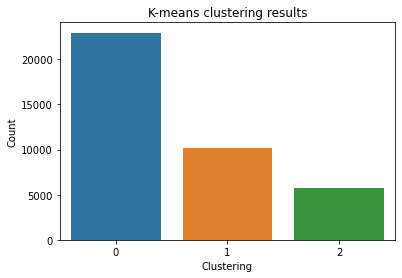

In [115]:
# plot the outcome of clutering 
sns.countplot(data = reviews, 
            x = 'kmeans')
plt.title('K-means clustering results')
plt.xlabel('Clustering')
plt.ylabel('Count')

**Explain the cluster**

In [116]:
# Calculate the mean of each column ( Group the cluster )
reviews.groupby(['kmeans']).mean()

,latitude,longitude,number_of_reviews,reviews_per_month,LR_days
kmeans,,,,,
0,40.729105,-73.955267,7.914607,0.491140,455.837017
1,40.725860,-73.944186,80.689389,3.065633,12.396957
2,40.728259,-73.946990,24.169204,1.910458,30.064879


- *Cluster 1: No competitiveness* **(kmeas label = 0)**

        The average number of reviews in Cluster 1 is only 7.9, the average reviews per month is also only 0.5, and the average last review days is more than a year. This indicates that it's likely the listings in this cluster have lost their competitiveness or are no longer providing services.

- *Cluster 2: Popular* **(kmeas label = 1)**

        Cluster 2 performs exceptionally well, with the highest accumulated number of reviews and the most reviews per month. The time since the last review is less than two weeks, indicating that these listings are active.

- *Cluster 3: Priority Assistance* **(kmeas label = 2)**

        This group's performance is inferior to Cluster 2, which means that there is still room for improvement. Therefore, I believe the platform can carry out marketing activities for the listings in this cluster to increase their booking rate.

- *Cluster 4: Never received a review*

        Listings in Cluster 4 have never received consumer reviews, indicating two possibilities:
    
        1. They have never been booked.
        2. They have just been listed on the Airbnb platform (but since we cannot obtain the date of the listing, this can only be speculated).

**The final step: visualization**

In [ ]:
# Popular Group Distribution Map
pgd_map = folium.Map(location=[40.64749, -73.97237],
                    zoom_start=12,
                    tiles='cartodbpositron')  # Stamen Terrain

popular_group = folium.FeatureGroup(name='Popular group')

for i, row in reviews[reviews['kmeans'] == 1].iterrows():
    # Create circle
    circle = folium.CircleMarker(location=[row['latitude'], row['longitude']],
                    popup= ("<b>Reviews: </b>" + str(row['number_of_reviews']) + '<br>'
                            "<b>Reviews_per_month: </b>" + str(row['reviews_per_month'])),
                    color='b',
                    fill=True, 
                    fill_opacity=1,
                    fill_color=colordict[row['kmeans']],
                    radius= 0.5,
                    name='circle')

    if row['kmeans'] == 1:
        popular_group.add_child(circle)

pgd_map.add_child(popular_group)

pgd_map.add_child(folium.LayerControl())
pgd_map

# pgd_map.save('ld.html')

The most competitive listings can be seen to be mostly located in the Manhattan and Brooklyn areas.

# Learning source

folium skill:
    https://blog.yeshuanova.com/2017/10/python-visulization-folium/
    https://towardsdatascience.com/data-visualization-with-python-folium-maps-a74231de9ef7

tooltips:
    https://towardsdatascience.com/using-folium-to-generate-choropleth-map-with-customised-tooltips-12e4cec42af2